In [1]:
import pandas as pd
import seaborn as sns
import numpy as np 
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from datetime import datetime
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression  
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.cluster import KMeans
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, confusion_matrix, ConfusionMatrixDisplay

In [2]:
data = pd.read_csv("1. Engineering_graduate_salary.csv")
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2998 entries, 0 to 2997
Data columns (total 34 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ID                     2998 non-null   int64  
 1   Gender                 2998 non-null   object 
 2   DOB                    2998 non-null   object 
 3   10percentage           2998 non-null   float64
 4   10board                2998 non-null   object 
 5   12graduation           2998 non-null   int64  
 6   12percentage           2998 non-null   float64
 7   12board                2998 non-null   object 
 8   CollegeID              2998 non-null   int64  
 9   CollegeTier            2998 non-null   int64  
 10  Degree                 2998 non-null   object 
 11  Specialization         2998 non-null   object 
 12  collegeGPA             2998 non-null   float64
 13  CollegeCityID          2998 non-null   int64  
 14  CollegeCityTier        2998 non-null   int64  
 15  Coll

In [3]:
data.head()

,ID,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,...,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Salary
0,604399,f,1990-10-22,87.80,cbse,2009,84.00,cbse,6920,1,...,-1,-1,-1,-1,-0.1590,0.3789,1.2396,0.14590,0.2889,445000
1,988334,m,1990-05-15,57.00,cbse,2010,64.50,cbse,6624,2,...,-1,-1,-1,-1,1.1336,0.0459,1.2396,0.52620,-0.2859,110000
2,301647,m,1989-08-21,77.33,"maharashtra state board,pune",2007,85.17,amravati divisional board,9084,2,...,-1,-1,260,-1,0.5100,-0.1232,1.5428,-0.29020,-0.2875,255000
3,582313,m,1991-05-04,84.30,cbse,2009,86.00,cbse,8195,1,...,-1,-1,-1,-1,-0.4463,0.2124,0.3174,0.27270,0.4805,420000
4,339001,f,1990-10-30,82.00,cbse,2008,75.00,cbse,4889,2,...,-1,-1,-1,-1,-1.4992,-0.7473,-1.0697,0.06223,0.1864,200000


In [4]:
# Task 1: Change Gender Column to 0 and 1
data['Gender'] = data['Gender'].map({'m': 1, 'f': 0})

# Task 2: Calculate Age from DOB
# Convert DOB to datetime with robust format handling
data['DOB'] = pd.to_datetime(data['DOB'], errors='coerce', format='%Y-%m-%d')

# Calculate age
current_year = datetime.now().year
data['Age'] = current_year - data['DOB'].dt.year

# Drop the DOB column
data.drop(columns=['DOB'], inplace=True)

# Task 3: Encode Degree, Specialization, and CollegeState
# Use label encoding
for column in ['Degree', 'Specialization', 'CollegeState']:
    data[column] = data[column].astype('category').cat.codes

# Task 4: Encode 10board and 12board
# Use label encoding for simplicity
data['10board'] = data['10board'].astype('category').cat.codes
data['12board'] = data['12board'].astype('category').cat.codes

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2998 entries, 0 to 2997
Data columns (total 34 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ID                     2998 non-null   int64  
 1   Gender                 2998 non-null   int64  
 2   10percentage           2998 non-null   float64
 3   10board                2998 non-null   int16  
 4   12graduation           2998 non-null   int64  
 5   12percentage           2998 non-null   float64
 6   12board                2998 non-null   int16  
 7   CollegeID              2998 non-null   int64  
 8   CollegeTier            2998 non-null   int64  
 9   Degree                 2998 non-null   int8   
 10  Specialization         2998 non-null   int8   
 11  collegeGPA             2998 non-null   float64
 12  CollegeCityID          2998 non-null   int64  
 13  CollegeCityTier        2998 non-null   int64  
 14  CollegeState           2998 non-null   int8   
 15  Grad

In [6]:
data.head(50)

,ID,Gender,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,...,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Salary,Age
0,604399,0,87.80,46,2009,84.00,63,6920,1,0,...,-1,-1,-1,-0.1590,0.3789,1.2396,0.14590,0.2889,445000,34
1,988334,1,57.00,46,2010,64.50,63,6624,2,0,...,-1,-1,-1,1.1336,0.0459,1.2396,0.52620,-0.2859,110000,34
2,301647,1,77.33,129,2007,85.17,5,9084,2,0,...,-1,260,-1,0.5100,-0.1232,1.5428,-0.29020,-0.2875,255000,35
3,582313,1,84.30,46,2009,86.00,63,8195,1,0,...,-1,-1,-1,-0.4463,0.2124,0.3174,0.27270,0.4805,420000,33
4,339001,0,82.00,46,2008,75.00,63,4889,2,0,...,-1,-1,-1,-1.4992,-0.7473,-1.0697,0.06223,0.1864,200000,34
5,609356,0,83.16,74,2007,77.00,63,10950,1,2,...,-1,313,-1,0.8463,-0.6201,-0.7585,-0.99500,-0.2859,440000,35
6,1081649,0,72.50,180,2007,53.20,229,14381,2,0,...,-1,-1,-1,0.1282,-0.4536,0.3174,0.90660,-0.0943,150000,35
7,610842,0,77.00,180,2009,88.00,229,13208,2,0,...,-1,-1,-1,0.1282,0.5454,0.4711,0.90660,-0.2859,105000,33
8,1183070,1,76.80,180,2010,87.70,229,5338,2,0,...,-1,-1,-1,-0.1590,-0.4536,0.1637,0.52620,-0.0943,195000,32
9,794062,0,57.00,180,2009,73.00,229,8346,2,0,...,-1,-1,-1,-0.7335,-0.4536,-0.2974,1.41360,0.6721,200000,31


In [7]:
# add your code here for data cleaning of the adventure data set INCOME
data.duplicated().any()

False

In [8]:
data.isnull().any()

ID                       False
Gender                   False
10percentage             False
10board                  False
12graduation             False
12percentage             False
12board                  False
CollegeID                False
CollegeTier              False
Degree                   False
Specialization           False
collegeGPA               False
CollegeCityID            False
CollegeCityTier          False
CollegeState             False
GraduationYear           False
English                  False
Logical                  False
Quant                    False
Domain                   False
ComputerProgramming      False
ElectronicsAndSemicon    False
ComputerScience          False
MechanicalEngg           False
ElectricalEngg           False
TelecomEngg              False
CivilEngg                False
conscientiousness        False
agreeableness            False
extraversion             False
nueroticism              False
openess_to_experience    False
Salary  

In [9]:
data.describe()

,ID,Gender,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,...,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Salary,Age
count,2.998000e+03,2998.000000,2998.000000,2998.000000,2998.000000,2998.000000,2998.000000,2998.000000,2998.000000,2998.000000,...,2998.000000,2998.000000,2998.000000,2998.000000,2998.000000,2998.000000,2998.000000,2998.000000,2.998000e+03,2998.000000
mean,6.648926e+05,0.761174,77.666264,102.531021,2008.080720,74.341061,130.597732,5210.210807,1.924616,0.227151,...,16.267845,31.068379,1.946965,-0.038714,0.126217,-0.008662,-0.145965,-0.141111,3.051748e+05,33.573382
std,3.648951e+05,0.426437,10.002785,69.550146,1.631814,11.120299,87.908415,4776.609877,0.264053,0.776341,...,86.054739,103.552963,32.241501,1.024974,0.955831,0.962695,1.012901,1.007134,2.123312e+05,1.751434
min,1.124400e+04,0.000000,43.000000,0.000000,1998.000000,40.000000,0.000000,2.000000,1.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-3.893300,-5.781600,-4.600900,-2.643000,-7.375700,3.500000e+04,27.000000
25%,3.334648e+05,1.000000,71.140000,46.000000,2007.000000,66.000000,63.000000,526.250000,2.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-0.649100,-0.435300,-0.604800,-0.868200,-0.669200,1.800000e+05,32.000000
50%,6.396945e+05,1.000000,78.965000,74.000000,2008.000000,74.000000,99.000000,4027.500000,2.000000,0.000000,...,-1.000000,-1.000000,-1.000000,0.046400,0.212400,0.091400,-0.172700,-0.094300,3.000000e+05,33.000000
75%,9.951770e+05,1.000000,85.600000,180.000000,2009.000000,82.600000,229.000000,8822.250000,2.000000,0.000000,...,-1.000000,-1.000000,-1.000000,0.702700,0.812800,0.672000,0.526200,0.502400,3.700000e+05,35.000000
max,1.297877e+06,1.000000,97.760000,220.000000,2012.000000,98.700000,276.000000,18409.000000,2.000000,3.000000,...,660.000000,548.000000,500.000000,1.995300,1.904800,2.161700,3.352500,1.630200,4.000000e+06,43.000000


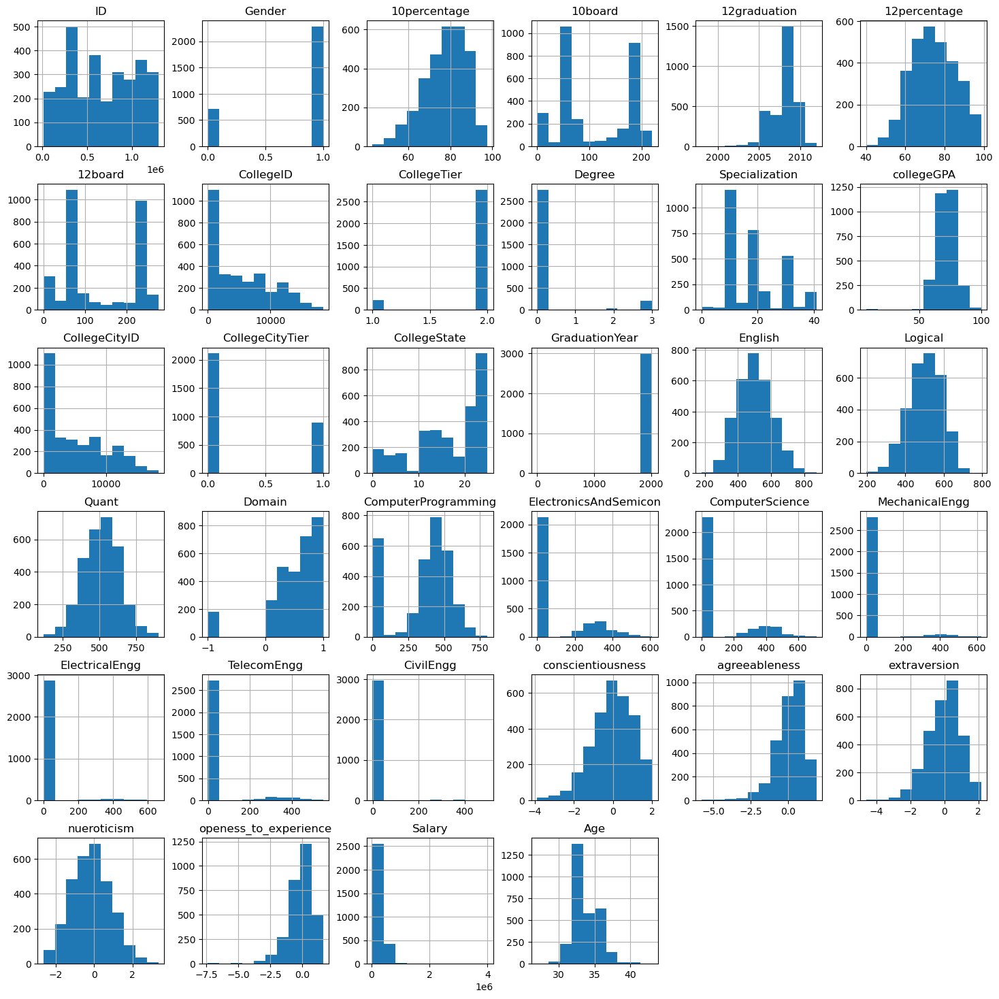

In [10]:
# Histograms for distribution
data.hist(figsize=(18, 18))
plt.show()

In [11]:
# Pairplot to see pairwise relationships
sns.pairplot(data)
plt.show()

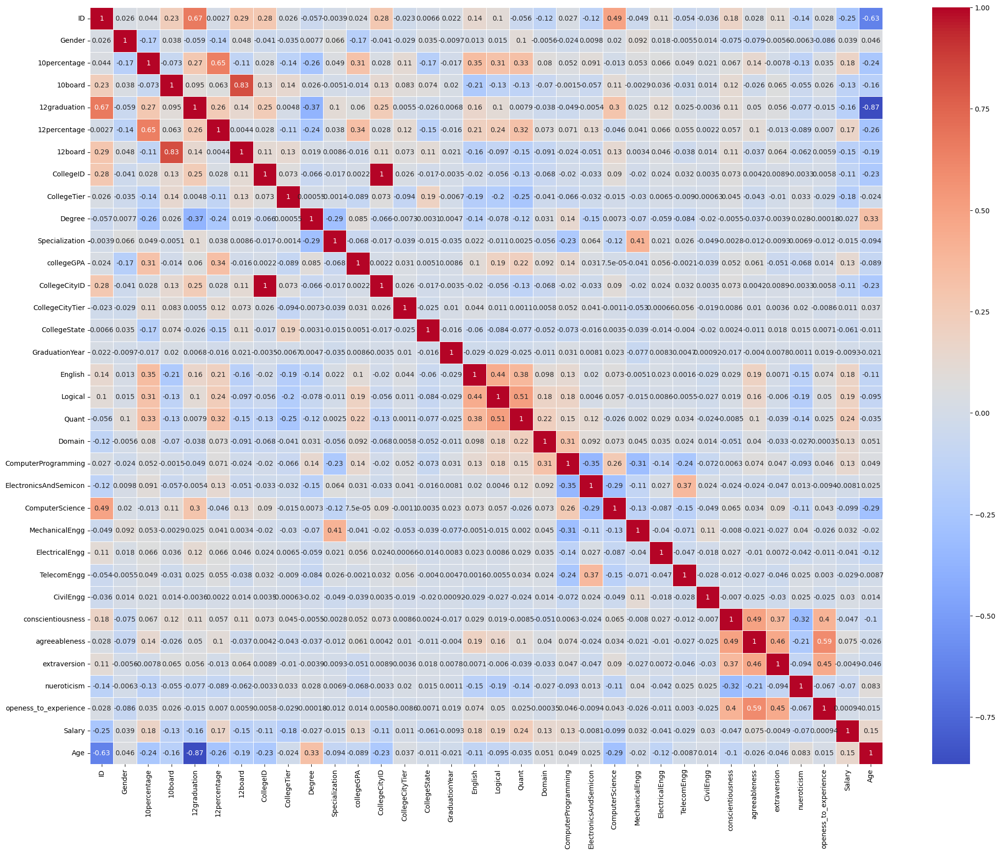

In [12]:
plt.figure(figsize=(26, 20))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm', linewidths=0.5)
plt.show()

In [16]:
# normalize values
scaler = StandardScaler()
scaled_features = scaler.fit_transform(data)
scaled_features.shape

(2998, 34)

In [17]:
data = pd.DataFrame(scaled_features, columns=data.columns)

模型的R^2为: 0.1606315383175635
The R^2 score of the model is: 0.1606315383175635
模型的均方误差(MSE)为: 0.5500655979169727
The mean squared error (MSE) of the model is: 0.5500655979169727
模型的系数为: [0.06760561 0.1039441  0.22084197 0.09778605 0.05069031 0.06701259
 0.05710856 0.09029225 0.03005482]
The coefficients of the model are: [0.06760561 0.1039441  0.22084197 0.09778605 0.05069031 0.06701259
 0.05710856 0.09029225 0.03005482]
模型的截距为: 0.007065357103287468
The intercept of the model is: 0.007065357103287468


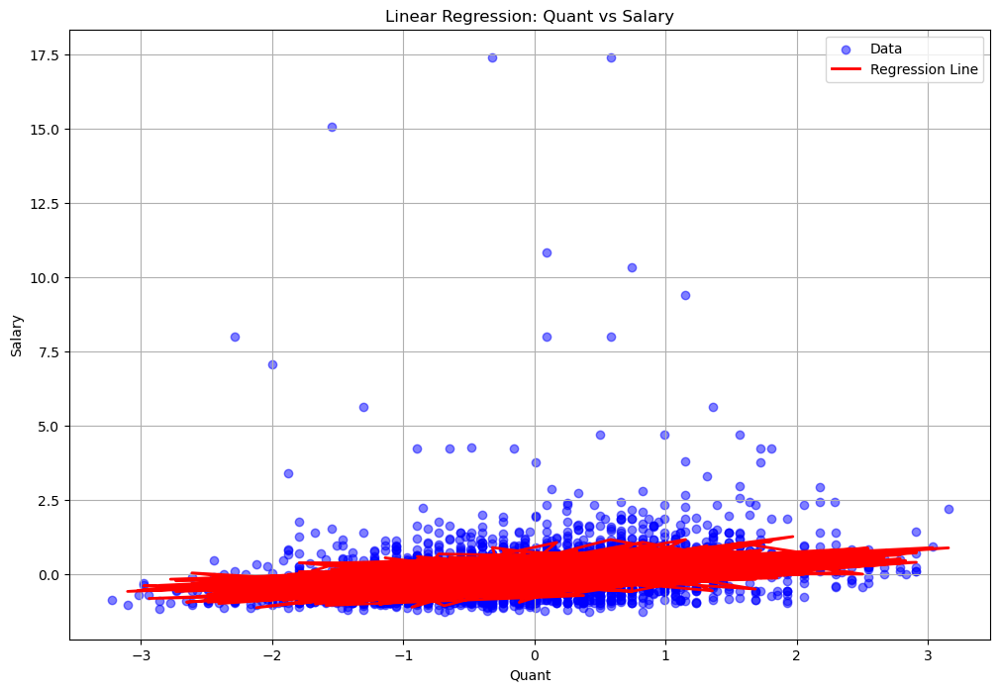

In [22]:
# 从数据中选择特征和目标变量
# Selecting features and target variable
X = data[['10percentage', '12percentage', 'Age', 'Quant', 'Domain', 'Logical', 'ComputerProgramming', 'English', 'collegeGPA']]
y = data['Salary']

# 分割数据为训练集和测试集
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 建立线性回归模型
# Create the linear regression model
model = LinearRegression()

# 训练模型
# Train the model
model.fit(X_train, y_train)

# 预测测试集
# Predict on the test set
y_pred = model.predict(X_test)

# 评估模型
# Evaluate the model
score = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
print(f"模型的R^2为: {score}")  # The R^2 score of the model
print(f"The R^2 score of the model is: {score}")

print(f"模型的均方误差(MSE)为: {mse}")  # The mean squared error (MSE) of the model
print(f"The mean squared error (MSE) of the model is: {mse}")

print(f"模型的系数为: {model.coef_}")  # The coefficients of the model
print(f"The coefficients of the model are: {model.coef_}")

print(f"模型的截距为: {model.intercept_}")  # The intercept of the model
print(f"The intercept of the model is: {model.intercept_}")

# 可视化：选择特征 'Quant' 作为 X 轴，并在训练集上绘制回归直线
# Visualization: Use 'Quant' as the x-axis and plot the regression line on the training set
plt.figure(figsize=(12, 8))

# 绘制原始数据点
# Plot the original data points
plt.scatter(X['Quant'], y, color='blue', alpha=0.5, label='Data')

# 为了绘制回归线，我们使用训练集来预测 y 值
# To plot the regression line, use the mean values for other features
# Create a DataFrame for prediction
X_plot = X_train.copy()
X_plot['Quant'] = X_train['Quant'].values  # Use actual 'Quant' values from training set
y_pred_line = model.predict(X_plot)

# 绘制回归线
# Plot the regression line
plt.plot(X_plot['Quant'], y_pred_line, color='red', linewidth=2, label='Regression Line')

plt.xlabel('Quant')  # Label for x-axis
plt.ylabel('Salary')  # Label for y-axis
plt.title('Linear Regression: Quant vs Salary')  # Title of the plot
plt.legend()
plt.grid(True)
plt.show()